# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

Нужно подключить свой гугл диск

In [2]:
de_dir_path = '../../../results/DE/mammals/ANOVA_zscore_laminar/'

In [3]:
os.makedirs('heatmaps', exist_ok=True)
os.makedirs('snakeplots', exist_ok=True)

In [4]:
os.listdir(de_dir_path)

['anova_zscore_mamm.csv',
 'cluster_spectr_anova_6.csv',
 'cluster_spectr_anova_7.csv',
 'cluster_spectr_anova_8.csv',
 'cluster_spectr_anova_9.csv',
 'desktop.ini',
 'ttest_zscore_human_monkeys.csv',
 'ttest_zscore_mamm.csv']

In [5]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6"]
cluster_color = ['red', 'blue', 'green',  'yellow', 'orange', 'purple', 'olive', 'pink', 'brown']
clusters_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I']

### DE results

In [6]:
anova_res = pd.read_csv(de_dir_path + 'anova_zscore_mamm.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
NOC2L,5.221104,10.0,0.842126,0.590729,0.673788
KLHL17,7.392538,10.0,1.756889,0.089652,0.181595
HES4,10.147366,10.0,1.476590,0.171623,0.282792
AGRN,11.209840,10.0,2.786144,0.006975,0.029890
SDF4,12.915461,10.0,1.824119,0.076337,0.162215


In [7]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_zscore_mamm.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,AGRN,L1,human,chimp,0.196414,0.850770,0.914458
1,UBE2J2,L1,human,chimp,-1.759429,0.128997,0.313726
2,ANKRD65,L1,human,chimp,-0.968948,0.369991,0.555576
3,TMEM240,L1,human,chimp,1.925872,0.102429,0.280322
4,NADK,L1,human,chimp,-7.397474,0.000313,0.011489


## Load normalized pseudobulks

In [8]:
pb_dir_path = '../../../data/pseudobulks/'

In [9]:
os.listdir(pb_dir_path)

['annotation_chimp.csv',
 'annotation_human.csv',
 'annotation_macaque.csv',
 'annotation_spatial_libd_human.csv',
 'expression_chimp.csv',
 'expression_human.csv',
 'expression_macaque.csv',
 'expression_mean_chimp.csv',
 'expression_mean_human.csv',
 'expression_mean_macaque.csv',
 'expression_mean_spatial_libd_human.csv',
 'expression_spatial_libd_human.csv',
 'expression_sum_chimp.csv',
 'expression_sum_human.csv',
 'expression_sum_macaque.csv',
 'expression_sum_spatial_libd_human.csv',
 'gene_sample_mean_chimp.csv',
 'gene_sample_mean_human.csv',
 'gene_sample_mean_macaque.csv',
 'gene_sample_mean_spatial_libd_human.csv',
 'pb_age.h5ad',
 'pb_age_sample_norm.h5ad',
 'pb_age_sample_norm_zscore.h5ad',
 'pb_mamm.h5ad',
 'pb_mamm_filtered.h5ad',
 'pb_mamm_laminar_filtered.h5ad',
 'pb_mamm_laminar_sample_zscore_filtered.h5ad',
 'pb_mamm_sample_norm.h5ad',
 'pb_mamm_sample_norm_filtered.h5ad',
 'pb_mamm_sample_norm_zscore.h5ad',
 'pb_mamm_sample_zscore_filtered.h5ad']

In [10]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mamm_laminar_sample_zscore_filtered.h5ad')
adata_pb_norm.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 76 × 9435
    obs: 'layer', 'sample_id', 'condition', 'lib_size', 'log_lib_size'
    var: 'sum_sq', 'df', 'F', 'PR(>F)', 'p_val_adj'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

# Visualisation

## PCA

In [11]:
adata_norm_anova = adata_pb_norm[:, adata_pb_norm.var.p_val_adj < 0.05]
df = pd.DataFrame(adata_norm_anova.X, columns=adata_norm_anova.var_names, index=adata_norm_anova.obs_names)
df.head()

,AGRN,UBE2J2,ANKRD65,TMEM240,NADK,GNB1,GABRD,PRXL2B,TP73,CHD5,...,PDE9A,NDUFV3,AGPAT3,PFKL,COL18A1,SLC19A1,COL6A2,LSS,DIP2A,PRMT2
L5.human_759,0.941529,1.184966,-1.243903,0.158311,0.356106,-0.133215,-1.135133,1.248247,0.970060,1.088127,...,1.129484,0.885143,-0.913210,1.064585,-0.592065,0.783214,0.225610,-0.140429,0.680244,-0.346517
L2.human_759,-1.298306,-0.947844,0.523121,-1.135065,0.038668,0.510181,-1.375785,0.258729,-0.633943,-0.269548,...,-1.536515,-1.181044,-0.106394,-0.157560,-0.004804,-1.791202,-0.822839,-1.111851,-0.975243,0.759532
L3.human_759,0.622130,0.207339,1.314273,-0.711472,-0.642581,0.762676,0.985921,0.491217,-0.633943,0.499558,...,0.915033,0.152762,-1.114841,0.034710,-0.483930,0.034719,-0.471914,-0.071219,-1.079287,-0.711799
L1.human_759,-0.868319,-1.273895,0.408551,-0.471025,-0.682409,-1.934125,0.397623,-1.167772,1.565711,-1.778558,...,0.365817,-1.313974,0.184877,-1.429609,1.996979,1.003277,1.920101,1.725510,0.999744,1.183187
L6.human_759,1.044826,-0.171655,-1.126632,0.519561,1.799359,0.602003,0.400810,0.428930,-0.633943,0.565250,...,-0.364426,0.657137,1.673808,1.159868,-0.396327,0.276502,-0.410020,0.382436,1.009366,0.559139


In [12]:
human_specific_genes = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.p_val_adj < 0.05)].gene.unique().tolist()
df_hs = df[human_specific_genes].copy()
df_hs.head()

,NADK,PPCS,ALG6,TTLL7,S1PR1,KCND3,ANKRD34A,RGS5,ACBD6,PROX1,...,SEPTIN9,TSHZ1,TSHZ3,MYADM,RTN4R,PARVB,FBLN1,MAPK8IP2,SOD1,PCP4
L5.human_759,0.356106,0.889144,-1.438635,0.385332,-0.472949,-1.056814,-0.016306,1.344343,-0.447546,-1.065723,...,-0.420988,0.249125,0.347204,0.664154,0.841743,1.355562,-0.837076,-0.203919,1.083446,1.268076
L2.human_759,0.038668,0.311928,-0.154746,-0.334800,0.075153,1.320213,0.354069,-1.089091,1.024564,1.456003,...,-0.179672,-0.777441,-0.984127,-0.580025,-0.335950,-1.046239,-0.072523,0.088782,-0.626927,-0.889127
L3.human_759,-0.642581,0.852122,-0.550440,-0.041225,-0.366989,-0.806423,-0.104943,-0.887102,0.205954,-0.134581,...,-0.220949,-0.455600,-0.501170,-0.384766,0.581750,-0.540062,-0.358208,0.439593,-0.099152,-0.937629
L1.human_759,-0.682409,-1.816304,0.926849,-1.653004,1.967958,1.042262,-1.791069,0.530706,1.194141,0.900331,...,1.948328,-0.064522,-0.602224,-1.229268,-1.818776,-0.996267,1.977491,-1.723333,-1.617236,-0.787797
L6.human_759,1.799359,0.053296,1.316949,1.393879,-0.741802,-0.623072,1.248887,-0.632403,-0.584147,-0.929710,...,-0.169063,1.860665,-0.073965,1.599525,0.729539,0.737696,-0.396270,1.335437,0.714179,0.985618


In [13]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = samples.sort_values()
    order_laminar = order[order.str.contains('L')].tolist()
    order_wm = order[order.str.contains('WM')].tolist()
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]
df_hs = df_hs.loc[sample_order['all']]

In [14]:
import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(adata_pb_norm.X.T)

In [15]:
fig = px.scatter(components, x=0, y=1, hover_name=adata_pb_norm.var_names, color=(adata_pb_norm.var.p_val_adj < 0.05))
fig.show('notebook')

# Clusterisation of the ANOVA significant genes

## Hierarchal clustering

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



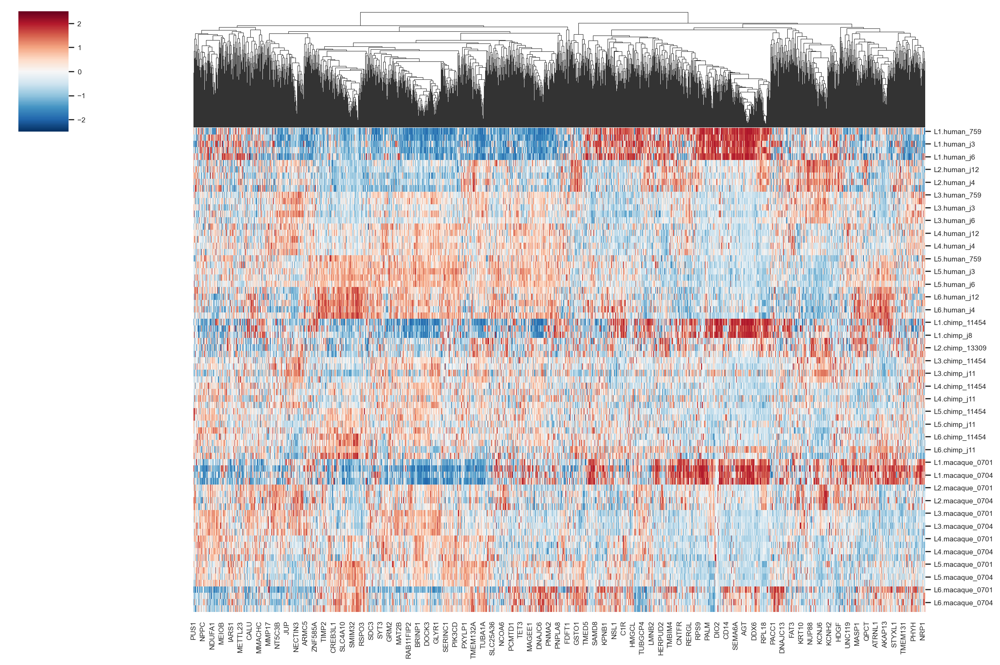

In [16]:
sns.set(font_scale=0.7)
sns.clustermap(df, figsize=(15, 10), cmap="RdBu_r", center=0, vmax=2.5, vmin=-2.5, metric='cosine', annot_kws={"size": 2}, row_cluster=False).savefig('heatmaps/clustermap_anova.png')

Clusterization for each layer

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix

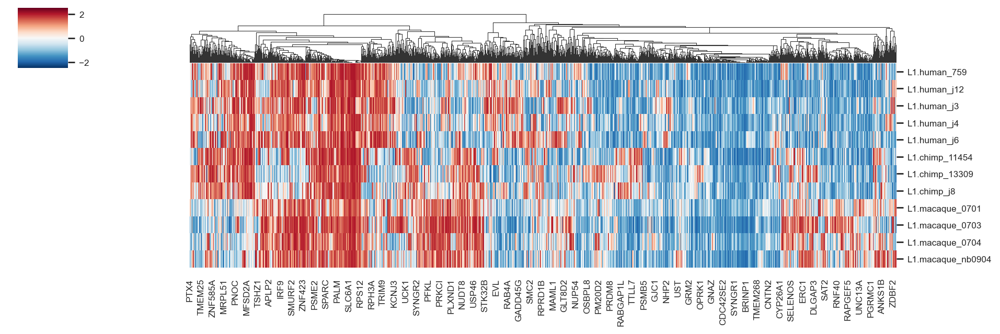

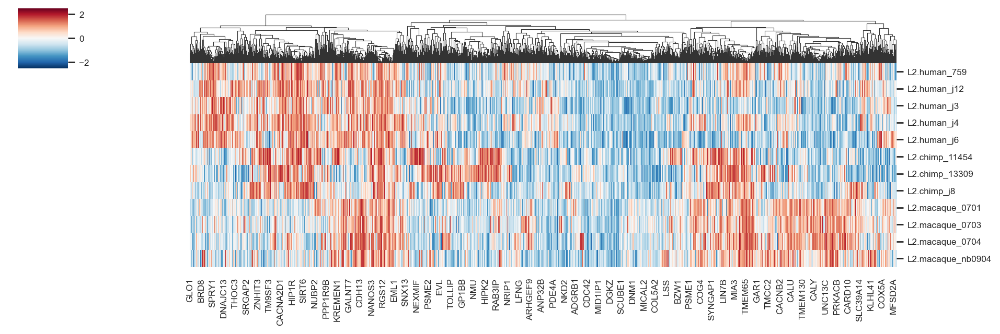

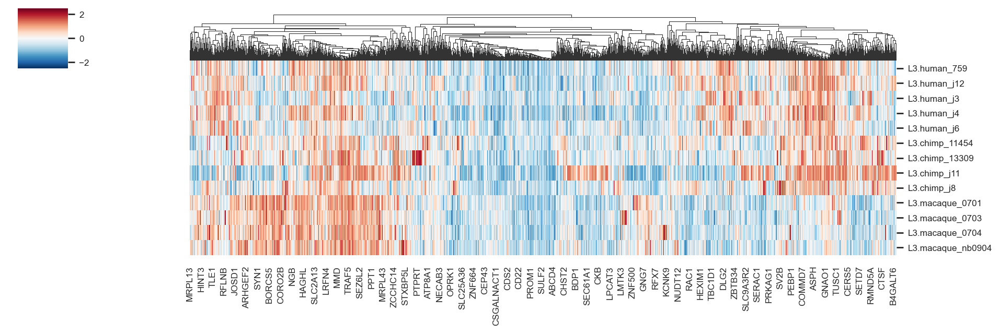

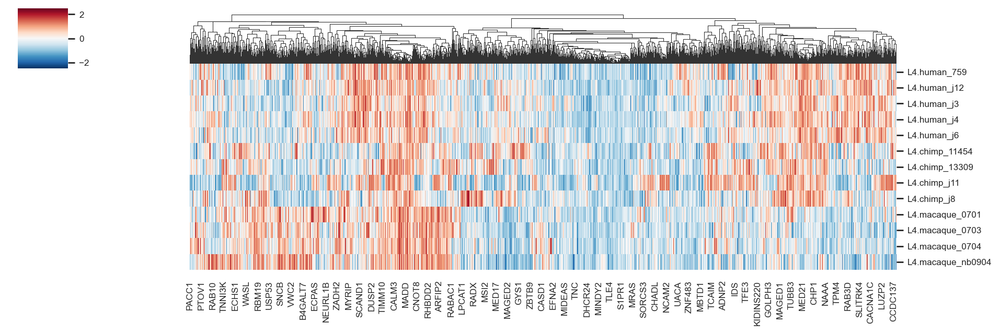

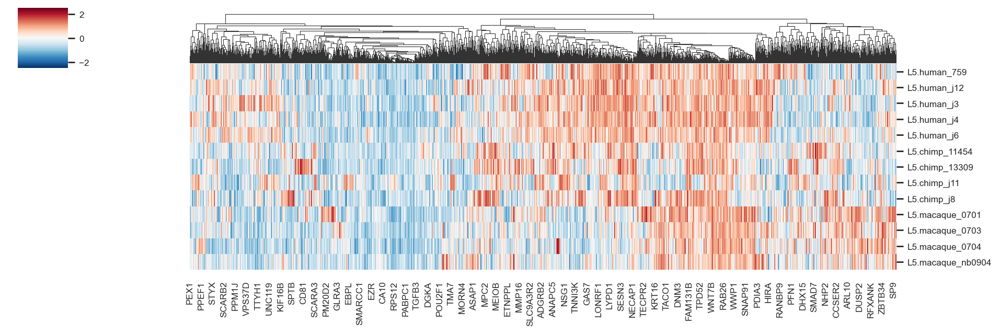

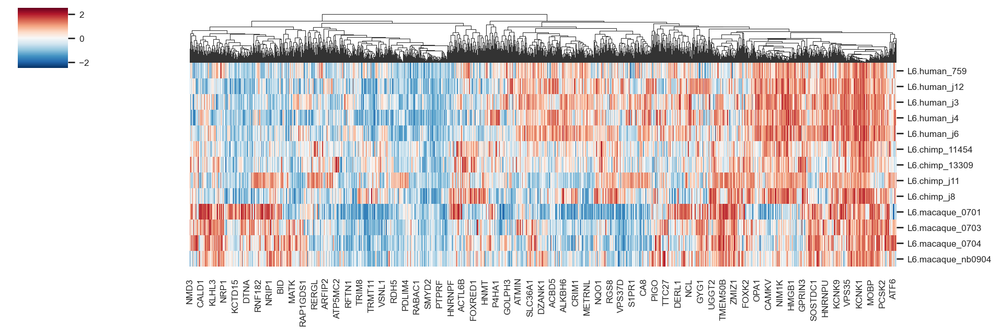

In [17]:
for layer in layers:
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.clustermap(df_layer, figsize=(12, 4), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False)

Clusterization for each specie

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

D:\Projects\diploma\venv_stats2\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



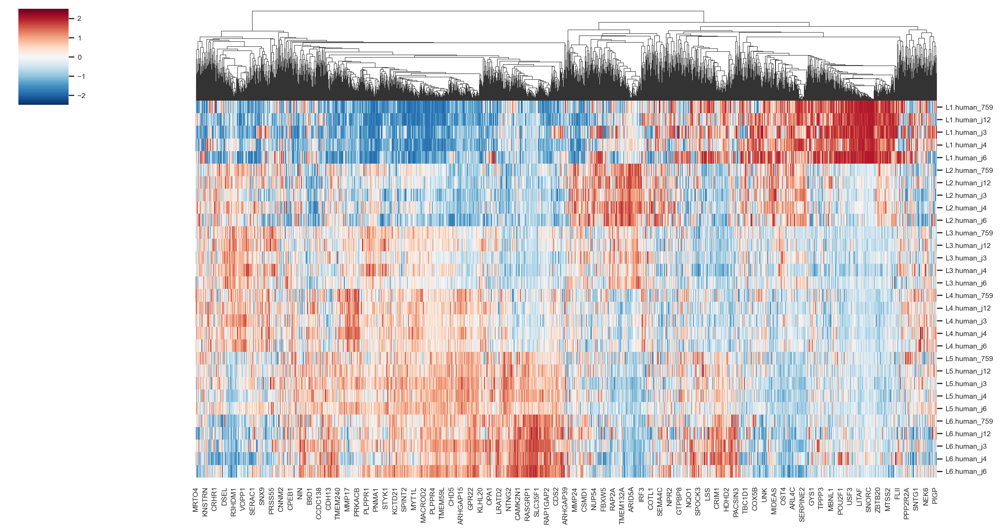

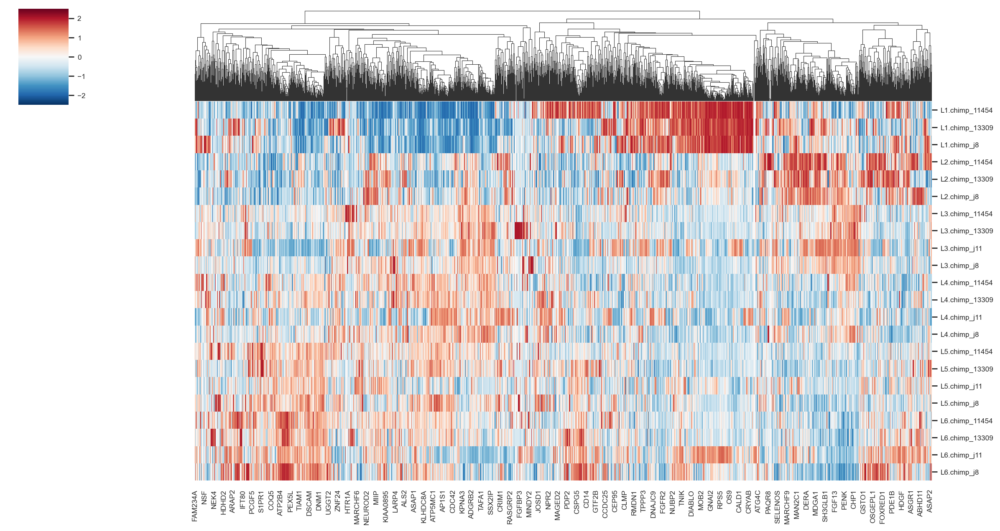

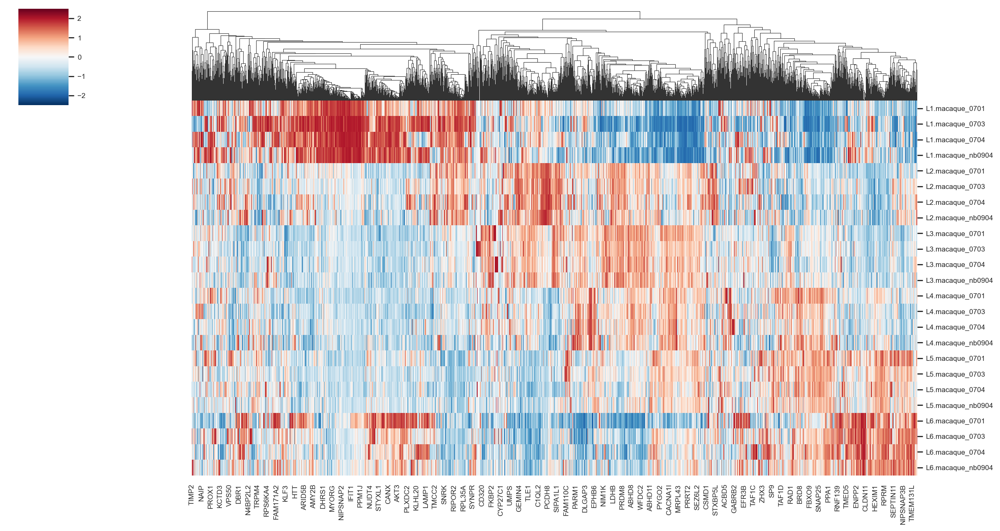

In [18]:
for cond in ['human', 'chimp', 'macaque']:
    df_cond = df.loc[df.index.str.contains(cond)]
    max_val = df_cond.max(axis=0).sort_values()
    df_cond = df_cond[max_val[max_val > 0].index.tolist()]
    sns.clustermap(df_cond, figsize=(15, 8), cmap="RdBu_r", center=0,
                   vmax=2.5, vmin=-2.5, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False)

## Spectral clustering

### 6 clusters

#### Clustering

In [19]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 6
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=6,
                   random_state=4)

In [20]:
cl_order = {i: a for i, a in enumerate([1, 4, 3, 2, 0, 5])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

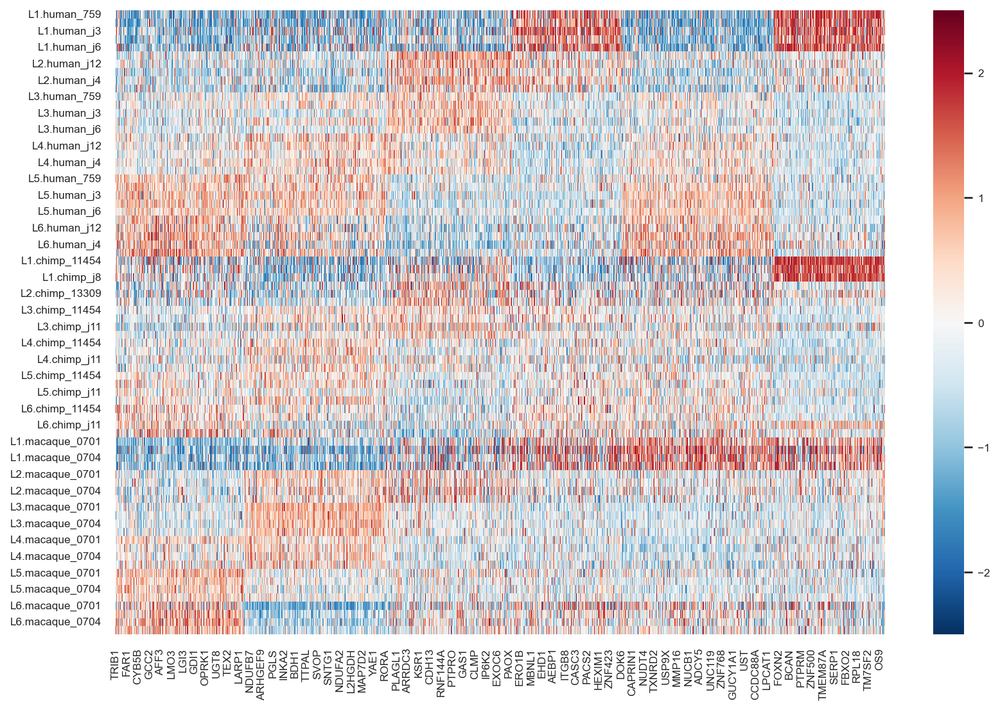

In [21]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

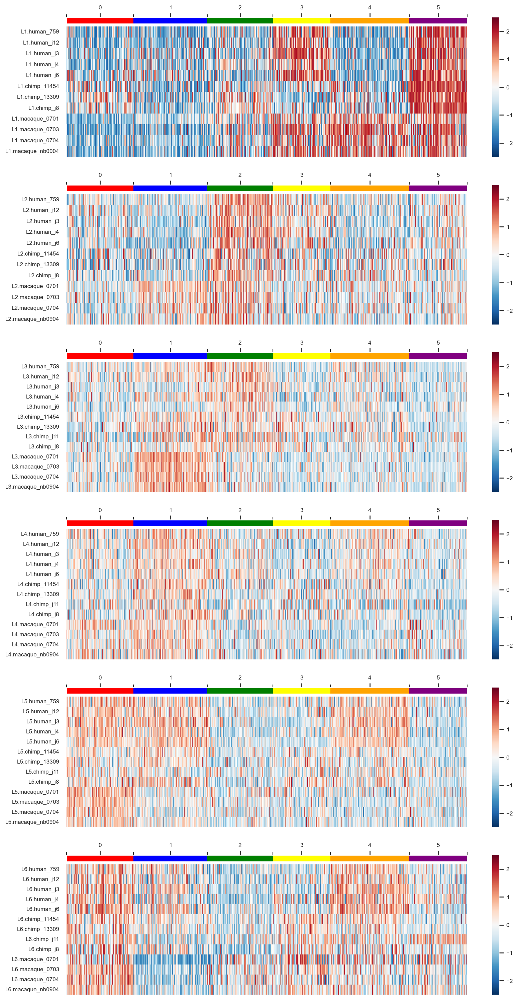

In [22]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(6, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

In [23]:
df_annotation = df.copy()
df_annotation['layer'] = adata_norm_anova.obs.layer
df_annotation['condition'] = adata_norm_anova.obs.condition

In [24]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

AGRN    UBE2J2  ANKRD65   TMEM240      NADK      GNB1  \
condition layer                                                              
chimp     L1    -0.956192  0.773837      0.0 -1.754486  1.519086 -1.571840   
          L2    -1.097568 -0.993644      0.0 -0.077071 -1.233378  0.725357   
          L3    -0.228824 -0.175268      0.0 -0.006117  0.364381  0.733233   
          L4     0.716686  0.784959      0.0  0.508951  0.024738  0.677719   
          L5     0.673588 -0.446070      0.0  0.409698 -0.021703 -0.178134   

                    GABRD    PRXL2B      TP73      CHD5  ...     PDE9A  \
condition layer                                          ...             
chimp     L1    -0.549265 -0.357797  1.841219 -1.434529  ...  0.231898   
          L2    -0.855741  0.555384 -0.725681  0.374346  ...  0.852112   
          L3     0.887532  0.506415 -0.428375  0.481862  ... -0.612015   
          L4     0.382980  0.369754 -0.119940  0.284855  ... -0.468330   
          L5    -0.176356 -0.236206 -0.179036  0.095954  ...  0.158071   

                   NDUFV3    AGPAT3      PFKL   COL18A1   SLC19A1  COL6A2  \
condition layer                                                             
chimp     L1    -0.397632  1.532410  0.383942  2.013880 -0.756343     0.0   
          L2     0.388778 -0.320263  0.117511 -0.194445 -0.371989     0.0   
          L3    -0.637413 -0.114175 -0.112595 -0.209578  0.457760     0.0   
          L4    -0.407863 -0.933538 -0.211769 -0.650473 -0.339898     0.0   
          L5     0.136434 -0.188412 -0.209679 -0.040143 -0.386431     0.0   

                      LSS     DIP2A     PRMT2  
condition layer                                
chimp     L1    -0.136083 -0.648532 -0.666795  
          L2    -0.136083 -0.073788  0.984509  
          L3     0.885310 -0.930961 -0.949598  
          L4    -0.227062 -0.640886 -0.302950  
          L5    -0.227062  0.659761  0.064038  

[5 rows x 2740 columns]

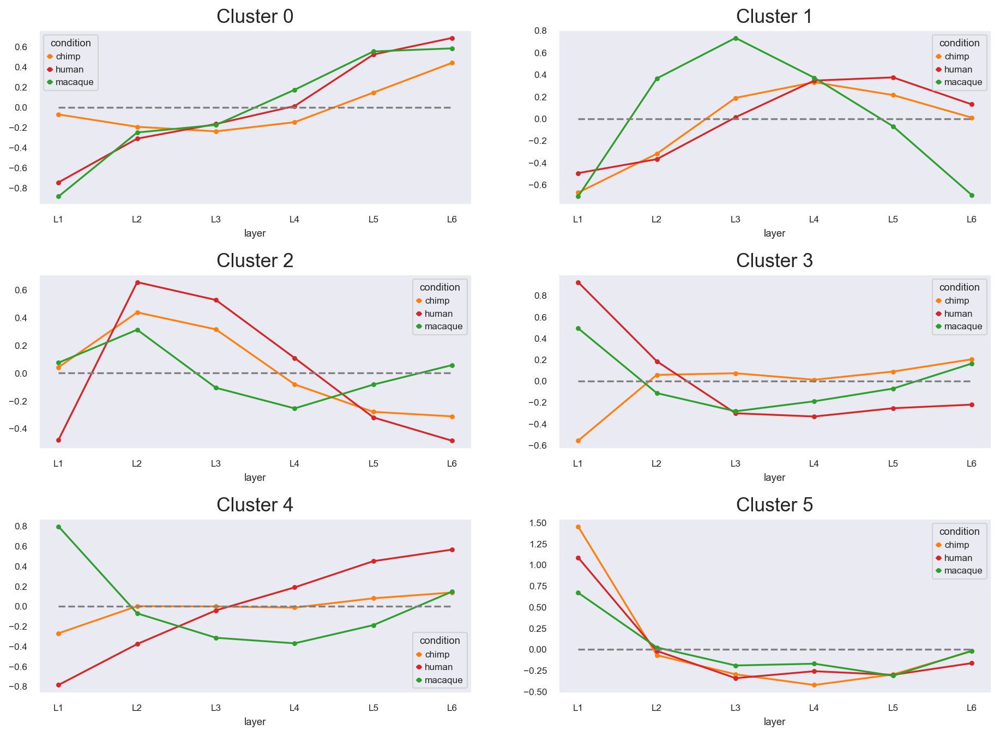

In [25]:
fig, axes = plt.subplots(n_clusters // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=5, colors='gray', linestyles='dashed')
plt.savefig(f'snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 7 clusters

#### Clustering

In [26]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [27]:
cl_order = {i: a for i, a in enumerate([3, 1, 4, 0, 2, 6, 5])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

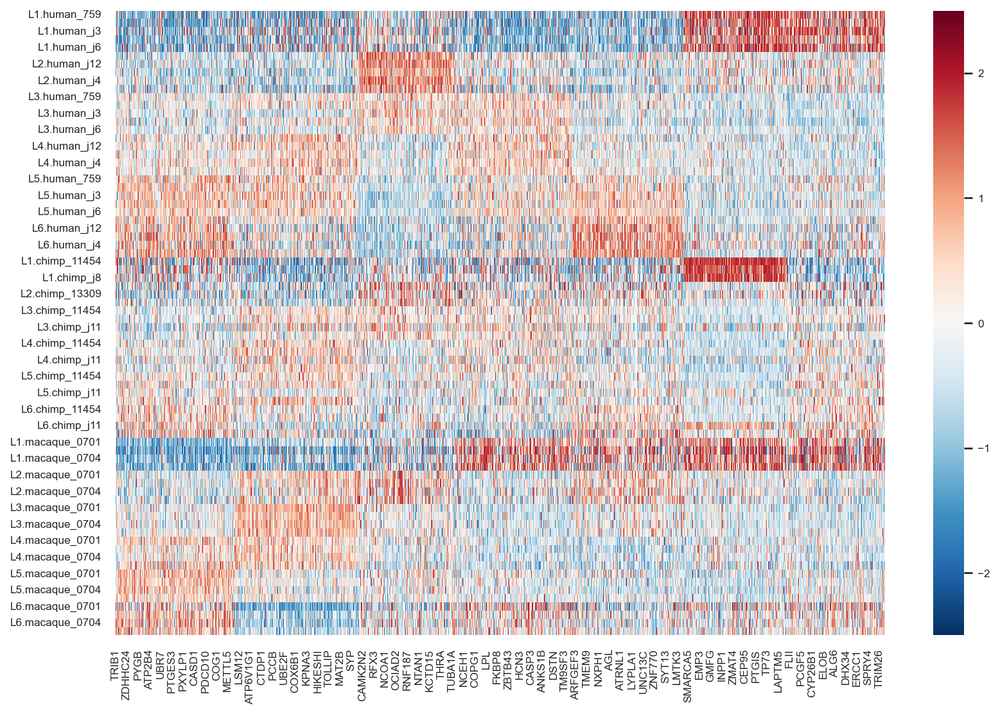

In [28]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

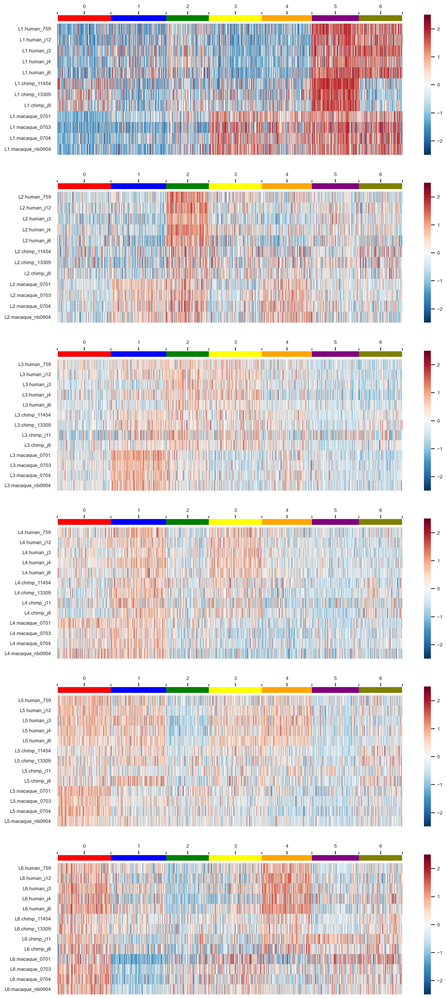

In [29]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(6, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

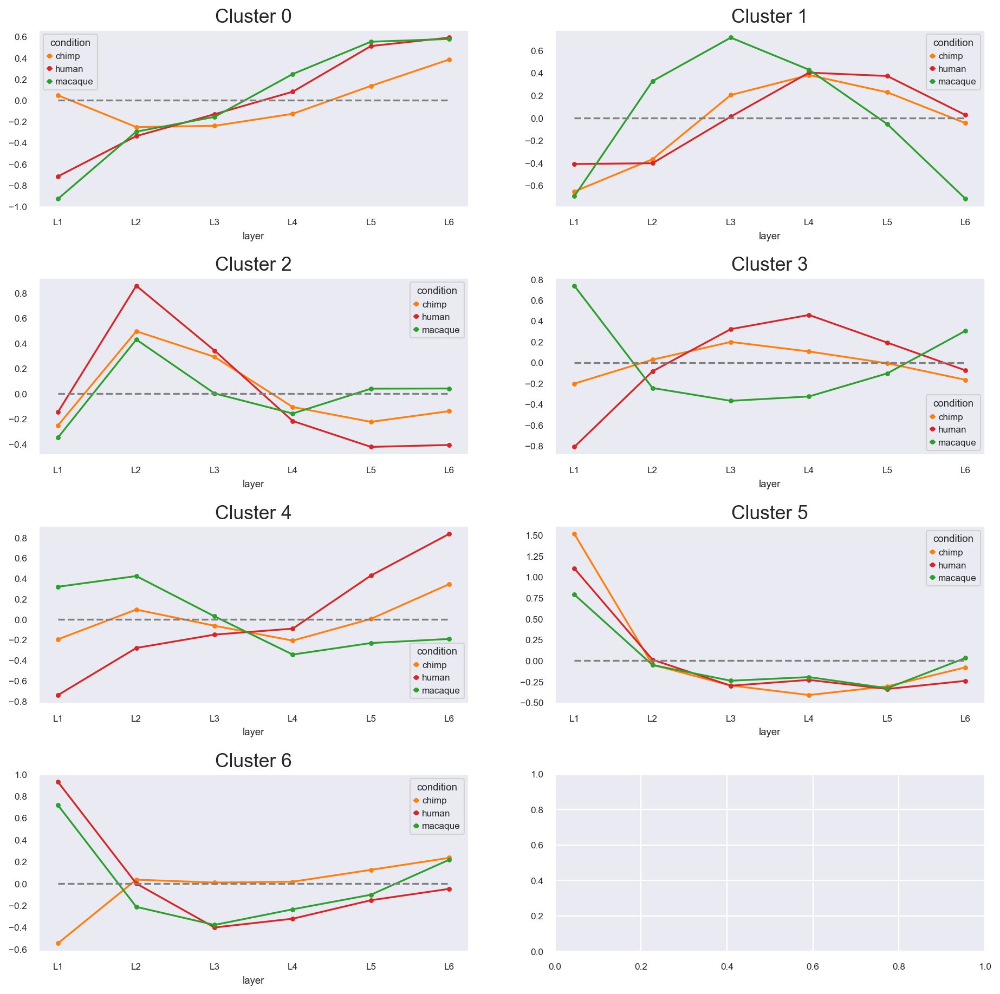

In [30]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=5, colors='gray', linestyles='dashed')
plt.savefig(f'snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 8 clusters

#### Clustering

In [31]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 8
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, random_state=4)

In [32]:
cl_order = {i: a for i, a in enumerate([7, 5, 2, 4, 1, 0, 6, 3])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

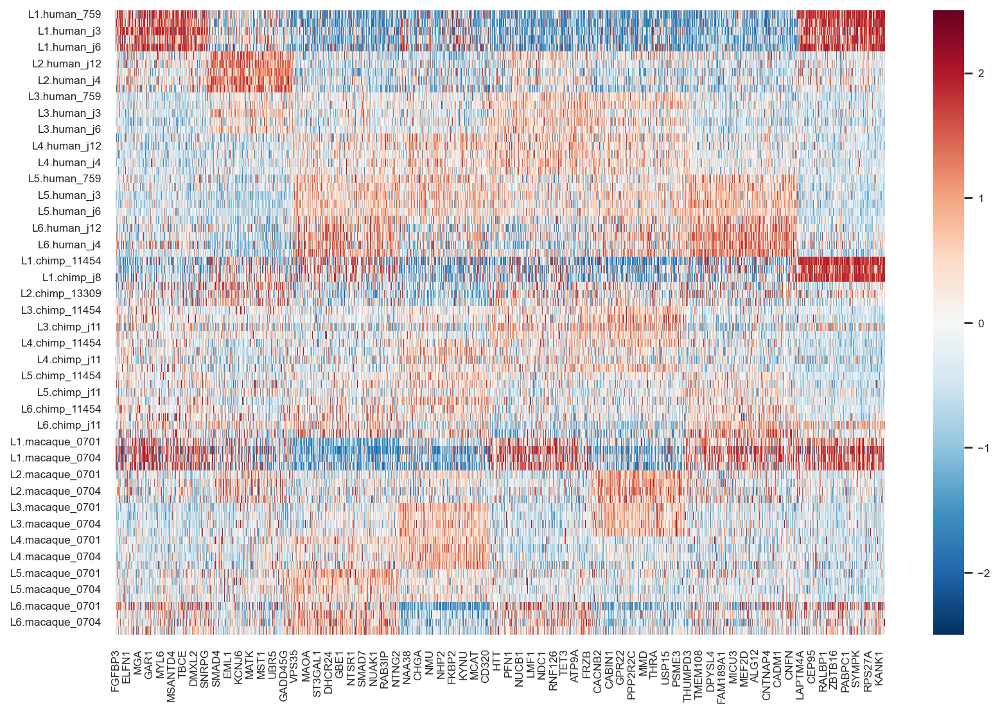

In [33]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

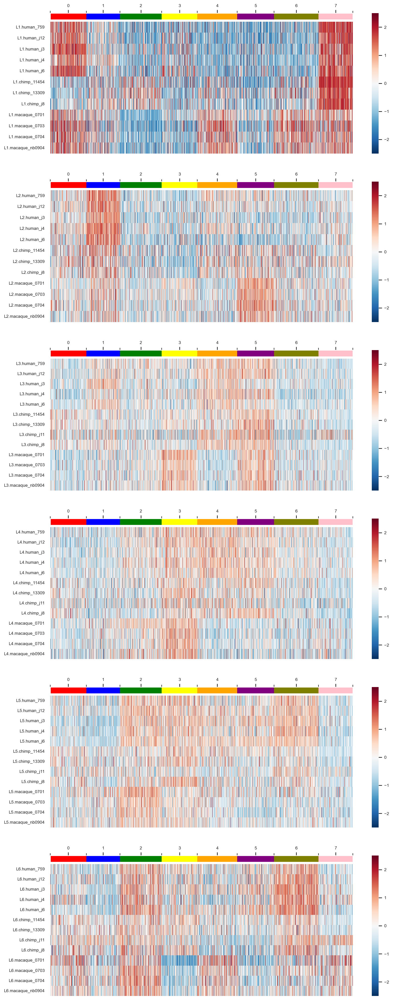

In [34]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(6, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

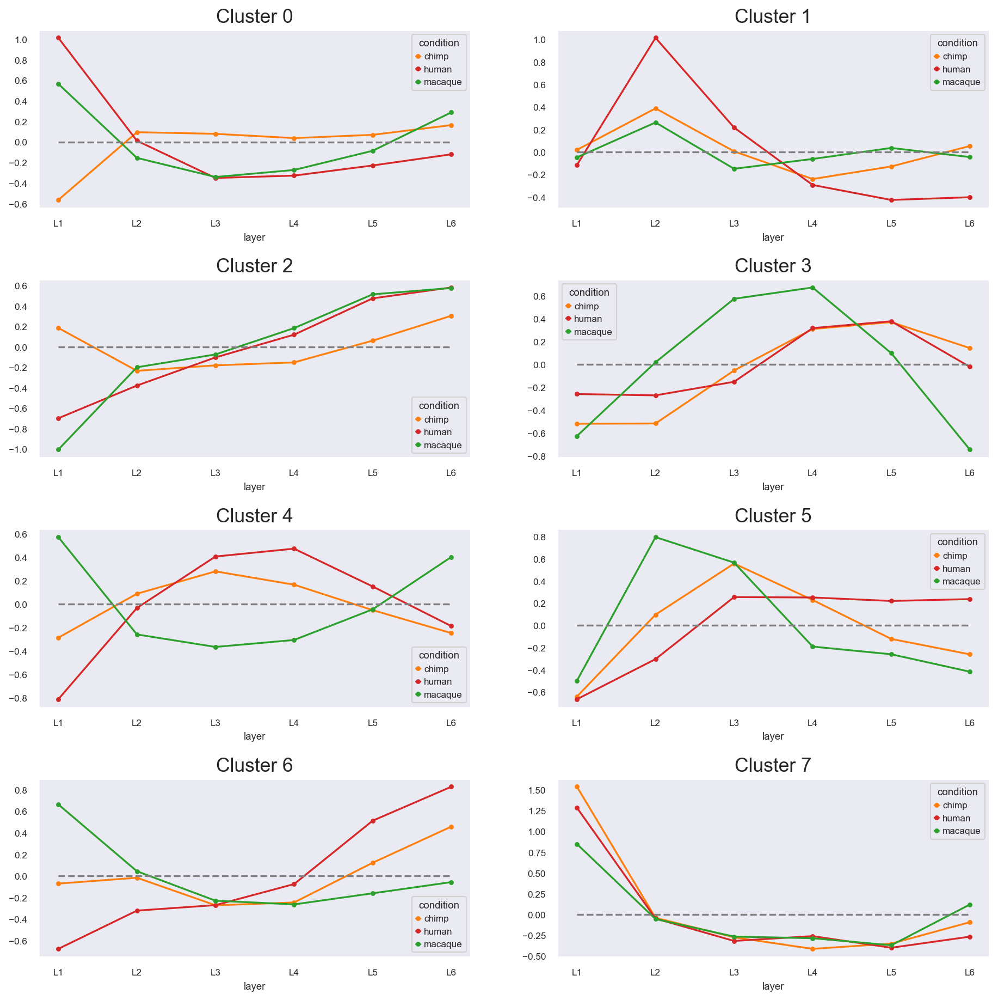

In [35]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=5, colors='gray', linestyles='dashed')
plt.savefig(f'snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 9 clusters

#### Clustering

In [36]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 9
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=9,
                   random_state=4)

In [37]:
cl_order = {i: a for i, a in enumerate([3, 5, 8, 0, 2, 6, 1, 7, 4])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

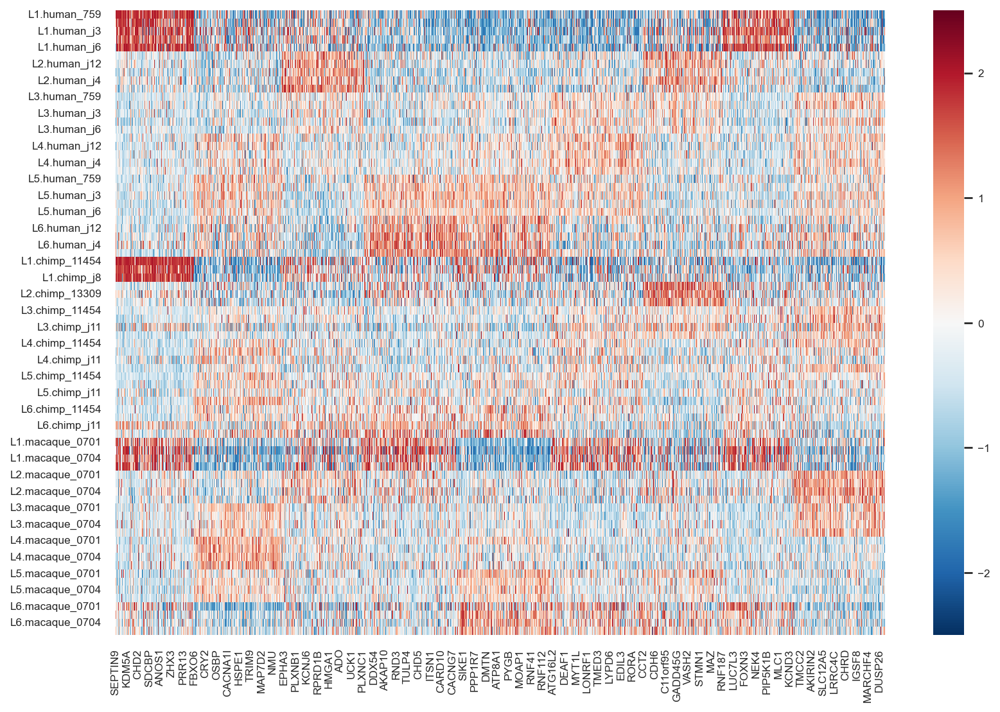

In [38]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0)
plt.savefig(f'heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

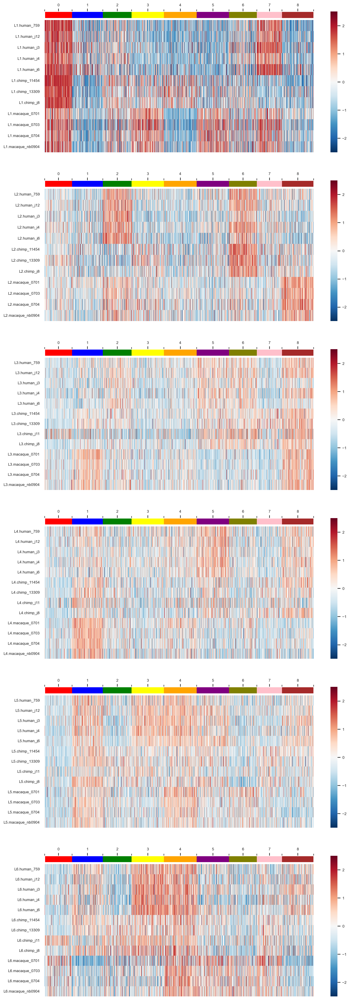

In [39]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(6, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=2.5, vmin=-2.5, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

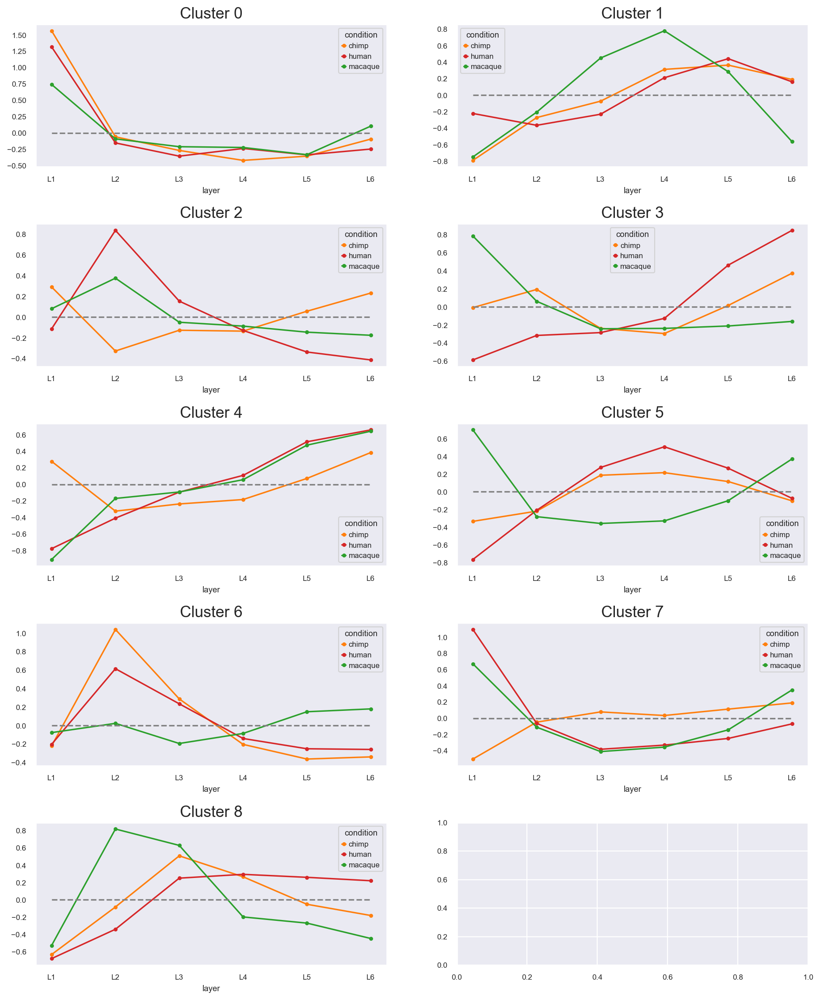

In [40]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=5, colors='gray', linestyles='dashed')
plt.savefig(f'snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')